# Sound tests

Let's hear how it sounds

In [1]:
pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import numpy as np
from minblep import generate_min_blep, gen_pure_saw, gen_bl_saw
from minblep.util import plot_spectrum

from IPython.display import Audio

SAMPLE_RATE = 44100

MIN_BLEP_50_2 = [val * 2 - 1 for val in generate_min_blep(50, 2)]

In [3]:
bl_a440_1s = np.array(list(gen_bl_saw(MIN_BLEP_50_2, 440, SAMPLE_RATE, int(1.0 * SAMPLE_RATE), np.pi)))
pure_a440_1s = np.array(list(gen_pure_saw(440, SAMPLE_RATE, int(1.0 * SAMPLE_RATE), np.pi)))

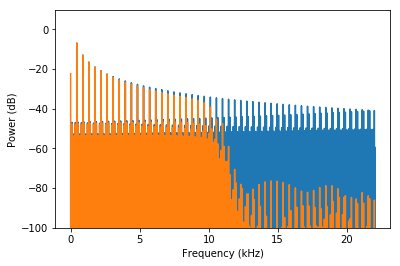

In [4]:
plot_spectrum(pure_a440_1s, SAMPLE_RATE)
plot_spectrum(bl_a440_1s, SAMPLE_RATE)

Wow, you can even **see** the aliasing above in the blue plot!

## Listening to what we have so far:

As mentioned in the BlepSawtooth notebook, the band-limited spectrum we're seeing and hearing here is a result of not interpolating the Blep, so we shouldn't actually expect it to sound very good.

In [5]:
Audio(bl_a440_1s, rate=SAMPLE_RATE)

In [6]:
Audio(pure_a440_1s, rate=SAMPLE_RATE)

## Sample Rate shennanigans

For the C code, we'll want to figure out a way to interpolate or downsample the over-sampled blep, but for the sake of experimenting here, we can also just try cranking up the sample rate on the waveform. 

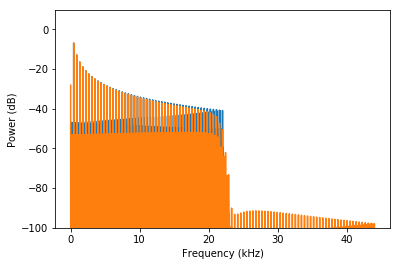

In [7]:
bl_a440_1s_2x = np.array(list(gen_bl_saw(MIN_BLEP_50_2, 440, 2 * SAMPLE_RATE, int(1.0 * SAMPLE_RATE), np.pi)))
plot_spectrum(pure_a440_1s, SAMPLE_RATE)
plot_spectrum(bl_a440_1s_2x, 2 * SAMPLE_RATE)

This immediately looks much more like what we'd expect!

Now let's see what it looks like with 100 zero crossings vs 50

(15, 30)

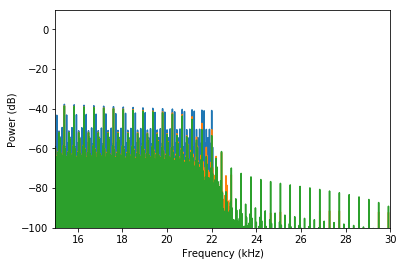

In [8]:
blep_100_2 = [val * 2 - 1 for val in generate_min_blep(100, 2)]
a440_100_2 = np.array(list(gen_bl_saw(blep_100_2, 440, 2 * SAMPLE_RATE, int(1.0 * SAMPLE_RATE), np.pi)))
plot_spectrum(pure_a440_1s, SAMPLE_RATE) # blue
plot_spectrum(bl_a440_1s_2x, 2 * SAMPLE_RATE) # orange
plot_spectrum(a440_100_2, 2 * SAMPLE_RATE) # green
xlim(xmin=15, xmax=30)

It looks like the version with 100 zero crossings drops off a lot slower than the 50zc verison, which makes sense, since each extra zero crossing is increasing the number of harmonics that are kept, sharpening the step.

How about going down to 5 or 10?

(10, 30)

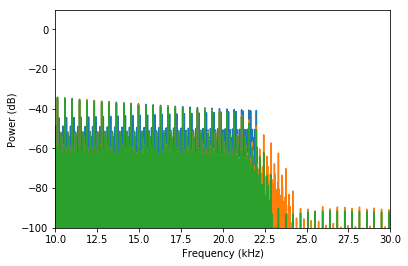

In [9]:
blep_20_2 = [val * 2 - 1 for val in generate_min_blep(20, 2)]
a440_20_2 = np.array(list(gen_bl_saw(blep_20_2, 440, 2 * SAMPLE_RATE, int(1.0 * SAMPLE_RATE), np.pi)))
plot_spectrum(pure_a440_1s, SAMPLE_RATE) # blue
plot_spectrum(a440_20_2, 2 * SAMPLE_RATE) # orange
plot_spectrum(bl_a440_1s_2x, 2 * SAMPLE_RATE) # green
xlim(xmin=10, xmax=30)

Or oversampling by 4x?

(10, 25)

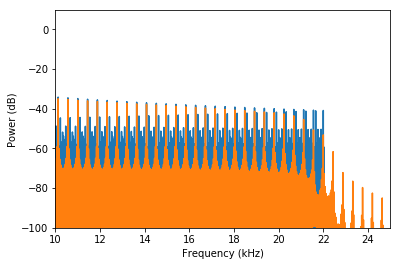

In [10]:
blep_100_4 = [val * 2 - 1 for val in generate_min_blep(100, 4)]
a440_100_4 = np.array(list(gen_bl_saw(blep_100_4, 440, 4 * SAMPLE_RATE, int(1.0 * SAMPLE_RATE), np.pi)))
plot_spectrum(pure_a440_1s, SAMPLE_RATE)
#plot_spectrum(bl_a440_1s_2x, 2 * SAMPLE_RATE)
plot_spectrum(a440_100_4, 4 * SAMPLE_RATE)
xlim(xmin=10, xmax=25)

(0, 2000)

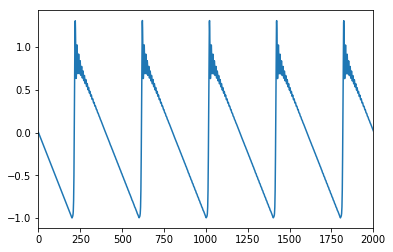

In [11]:
plot(a440_100_4)
xlim(xmin=0, xmax=2000)

(0, 2000)

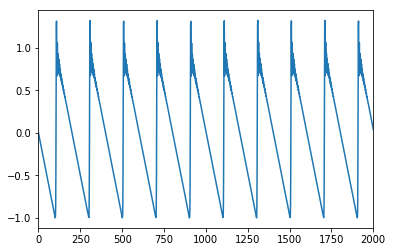

In [12]:
plot(bl_a440_1s_2x)
xlim(xmin=0, xmax=2000)

In [13]:
Audio(bl_a440_1s_2x, rate=2 * SAMPLE_RATE)

In [14]:
Audio(a440_100_4, rate=4 * SAMPLE_RATE)

In [15]:
Audio(a440_20_2, rate=2 * SAMPLE_RATE)

In [16]:
a1760_100_4 = np.array(list(gen_bl_saw(blep_100_4, 1760, 4 * SAMPLE_RATE, int(4.0 * SAMPLE_RATE), np.pi)))
a1760_20_2 = np.array(list(gen_bl_saw(blep_20_2, 1760, 2 * SAMPLE_RATE, int(2.0 * SAMPLE_RATE), np.pi)))
bl_a1760_1s_2x = np.array(list(gen_bl_saw(MIN_BLEP_50_2, 1760, 2 * SAMPLE_RATE, int(2.0 * SAMPLE_RATE), np.pi)))

In [17]:
Audio(a1760_20_2, rate=2 * SAMPLE_RATE)

In [18]:
Audio(a1760_100_4, rate=4 * SAMPLE_RATE)

In [19]:
Audio(bl_a1760_1s_2x, rate=2 * SAMPLE_RATE)

In [20]:
pure_a1760_1s = np.array(list(gen_pure_saw(1760, SAMPLE_RATE, int(1.0 * SAMPLE_RATE), np.pi)))

In [21]:
Audio(pure_a1760_1s, rate=SAMPLE_RATE)

In [22]:
a3520_100_4 = np.array(list(gen_bl_saw(blep_100_4, 3520, 4 * SAMPLE_RATE, int(4.0 * SAMPLE_RATE), np.pi)))
blep_11_2 = [val * 2 - 1 for val in generate_min_blep(11, 2)]
a3520_11_2 = np.array(list(gen_bl_saw(blep_11_2, 3520, 2 * SAMPLE_RATE, int(2.0 * SAMPLE_RATE), np.pi)))
pure_a3520_1s = np.array(list(gen_pure_saw(3520, SAMPLE_RATE, int(1.0 * SAMPLE_RATE), np.pi)))

In [23]:
Audio(pure_a3520_1s, rate=SAMPLE_RATE)

In [24]:
Audio(a3520_11_2, rate=2*SAMPLE_RATE)

In [25]:
Audio(a3520_100_4, rate=4*SAMPLE_RATE)

In [26]:
blep_12_8 = [val * 2 - 1 for val in generate_min_blep(12, 8)]
a3520_12_8 = np.array(list(gen_bl_saw(blep_12_8, 3520, 8 * SAMPLE_RATE, int(8.0 * SAMPLE_RATE), np.pi)))
Audio(a3520_12_8, rate=8*SAMPLE_RATE)

In [27]:
blep_12_20 = [val * 2 - 1 for val in generate_min_blep(12, 20)]
a3520_12_20 = np.array(list(gen_bl_saw(blep_12_20, 3520, 20 * SAMPLE_RATE, int(20.0 * SAMPLE_RATE), np.pi)))
Audio(a3520_12_20, rate=20*SAMPLE_RATE)

In [28]:
def listen(zero_crossings, oversampling, frequency, duration):
    the_blep = [val * 2 - 1 for val in generate_min_blep(zero_crossings, oversampling)]
    oversample_rate = oversampling * SAMPLE_RATE
    the_wave = np.array(list(gen_bl_saw(the_blep, frequency, oversample_rate, int(duration * oversample_rate), np.pi)))
    return Audio(the_wave, rate=oversample_rate)

In [29]:
listen(100, 20, 3520, 1)

In [30]:
listen(5, 20, 3520, 1)

In [31]:
listen(5, 40, 3520, 1)

In [32]:
listen(5, 10, 3520, 1)

In [33]:
listen(12, 16, 3520, 1)